<a href="https://colab.research.google.com/github/AnastasiiaVladimirovna/transcriptomics_homeworks/blob/main/hw15.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Часть с семинаром

In [ ]:
# Установка необходимых пакетов
!pip install scanpy[leiden] muon scikit-misc harmonypy mofapy2

# Необходимо, чтобы конкретно прогрузился matplotlib
import os
os.kill(os.getpid(), 9)

In [1]:
# Загрузка необхоnдимых датасетов

## CITE-Seq
!wget https://ftp.ncbi.nlm.nih.gov/geo/series/GSE194nnn/GSE194122/suppl/GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad.gz
!gunzip GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad.gz

--2022-12-27 04:46:02--  https://ftp.ncbi.nlm.nih.gov/geo/series/GSE194nnn/GSE194122/suppl/GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad.gz
Resolving ftp.ncbi.nlm.nih.gov (ftp.ncbi.nlm.nih.gov)... 130.14.250.10, 130.14.250.11, 2607:f220:41e:250::10, ...
Connecting to ftp.ncbi.nlm.nih.gov (ftp.ncbi.nlm.nih.gov)|130.14.250.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 615842052 (587M) [application/x-gzip]
Saving to: ‘GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad.gz’

GSE194122_openprobl 100%[===================>] 587.31M  43.6MB/s    in 15s     

2022-12-27 04:46:18 (38.8 MB/s) - ‘GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad.gz’ saved [615842052/615842052]

gzip: GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad already exists; do you wish to overwrite (y or n)? n
	not overwritten


In [2]:
# Подгрузка необходимых библиотек
import scanpy as sc
import muon as mu
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

sc.set_figure_params(dpi=150)

In [3]:
# Вспомогательная функция, чтобы создать объект
def create_MuData(adata, var_key="feature_types", layer="counts", batch_key="batch",
                  obs_columns=["cell_type", "batch"], batches=["s1d1", "s2d4"]):
  mdata = {}
  for mod in set(adata.var[var_key]):
    if layer == "X":
      X = adata[np.isin(adata.obs[batch_key], batches), adata.var[var_key] == mod].X
    else:
      X = adata[np.isin(adata.obs[batch_key], batches), adata.var[var_key] == mod].layers[layer]
    mdata[mod] = sc.AnnData(X=X, obs=adata[np.isin(adata.obs[batch_key], batches)].obs[obs_columns],
                            var=pd.DataFrame(index=f"{mod}_" + adata.var_names[adata.var[var_key] == mod]))
    mdata[mod].var_names_make_unique()
  mdata = mu.MuData(mdata)
  return mdata

# Чтение датасета CITE-Seq
adata_cite = sc.read_h5ad("GSE194122_openproblems_neurips2021_cite_BMMC_processed.h5ad")
mdata = create_MuData(adata_cite)
del adata_cite

mdata["GEX"].layers["counts"] = mdata["GEX"].X.copy()
mdata["ADT"].layers["counts"] = mdata["ADT"].X.copy()

/usr/local/lib/python3.8/dist-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


## Модальность РНК

### Без батч-коррекции

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


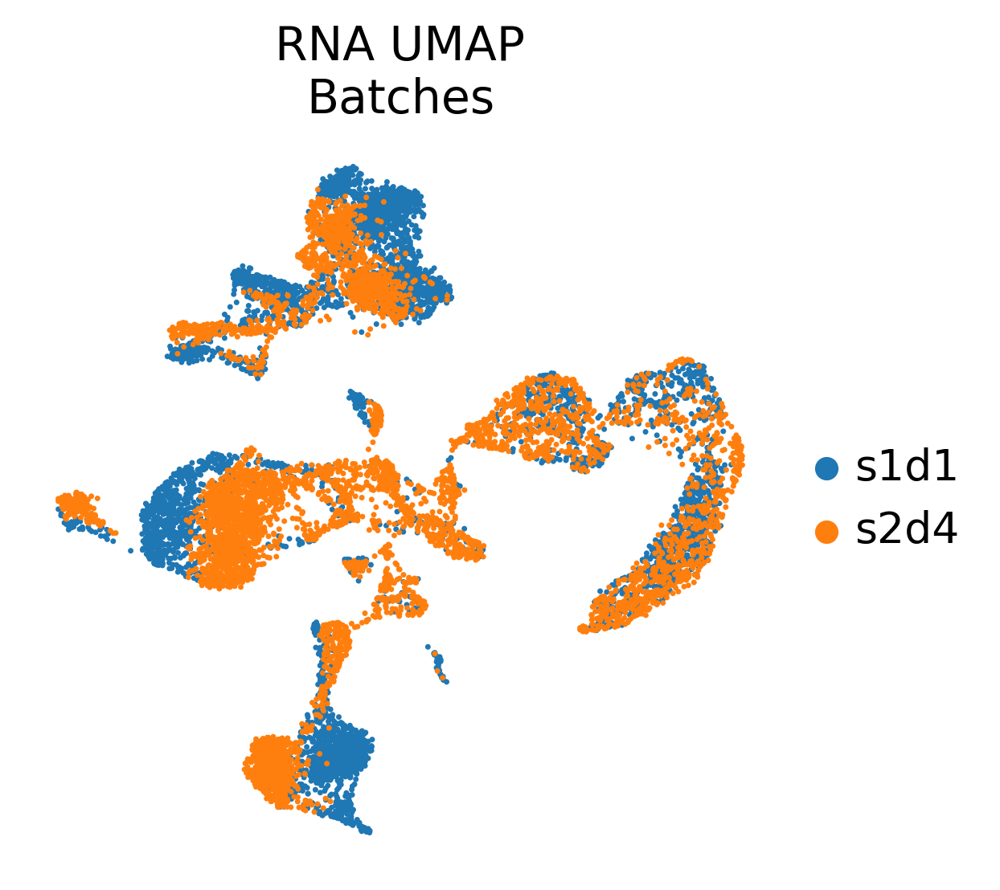

In [4]:
# Убедимся, что в `adata.X` лежат каунты
mdata["GEX"].X = mdata["GEX"].layers["counts"].copy()

# Нормализация
sc.pp.normalize_total(mdata["GEX"])
sc.pp.log1p(mdata["GEX"])

# Выделение HVG
sc.pp.highly_variable_genes(mdata["GEX"], n_top_genes=3000,
                            flavor="seurat_v3", layer="counts")

# PCA
sc.pp.scale(mdata["GEX"], max_value=10)
sc.tl.pca(mdata["GEX"], n_comps=30)

# kNN-граф
sc.pp.neighbors(mdata["GEX"], n_neighbors=20)

# UMAP
sc.tl.umap(mdata["GEX"])
sc.pl.umap(mdata["GEX"], color="batch", frameon=False,
           title="RNA UMAP\nBatches")

### С батч-коррекцией

2022-12-27 04:49:16,872 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-27 04:49:26,652 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-27 04:49:26,798 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2022-12-27 04:49:31,913 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2022-12-27 04:49:36,920 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2022-12-27 04:49:41,966 - harmonypy - INFO - Iteration 4 of 20
INFO:harmonypy:Iteration 4 of 20
2022-12-27 04:49:47,213 - harmonypy - INFO - Converged after 4 iterations
INFO:harmonypy:Converged after 4 iterations
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


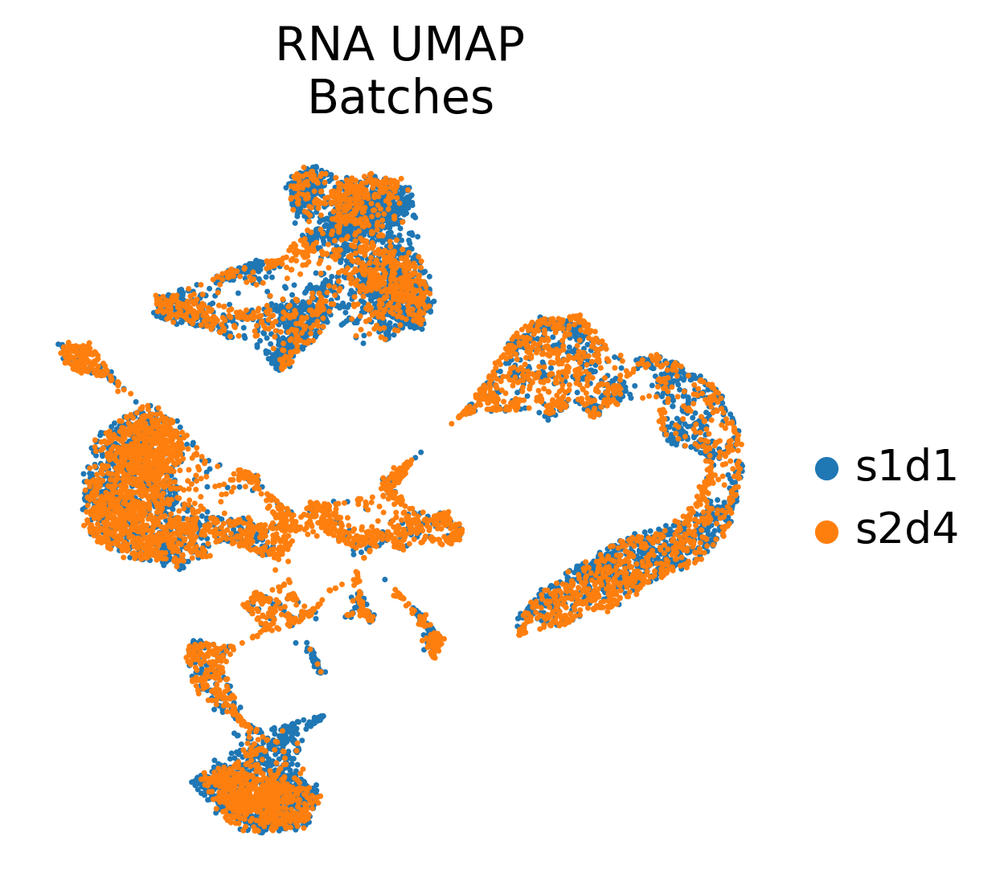

In [5]:
# Коррекция батч-эффекта при помощи harmony
import scanpy.external as sce

# Убедимся, что в `adata.X` лежат каунты
mdata["GEX"].X = mdata["GEX"].layers["counts"].copy()

# Нормализация
sc.pp.normalize_total(mdata["GEX"], target_sum=1e4)
sc.pp.log1p(mdata["GEX"])

# Выделение HVG
sc.pp.highly_variable_genes(mdata["GEX"], n_top_genes=3000,
                            flavor="seurat_v3", layer="counts",
                            batch_key="batch")

# PCA и Harmony
mdata["GEX"].raw = mdata["GEX"]
sc.pp.scale(mdata["GEX"], max_value=10)
sc.tl.pca(mdata["GEX"], n_comps=30)
sce.pp.harmony_integrate(mdata["GEX"], key="batch", max_iter_harmony=20)

# kNN-граф
sc.pp.neighbors(mdata["GEX"], n_pcs=30, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
sc.tl.umap(mdata["GEX"])
sc.pl.umap(mdata["GEX"], color="batch", frameon=False,
           title="RNA UMAP\nBatches")

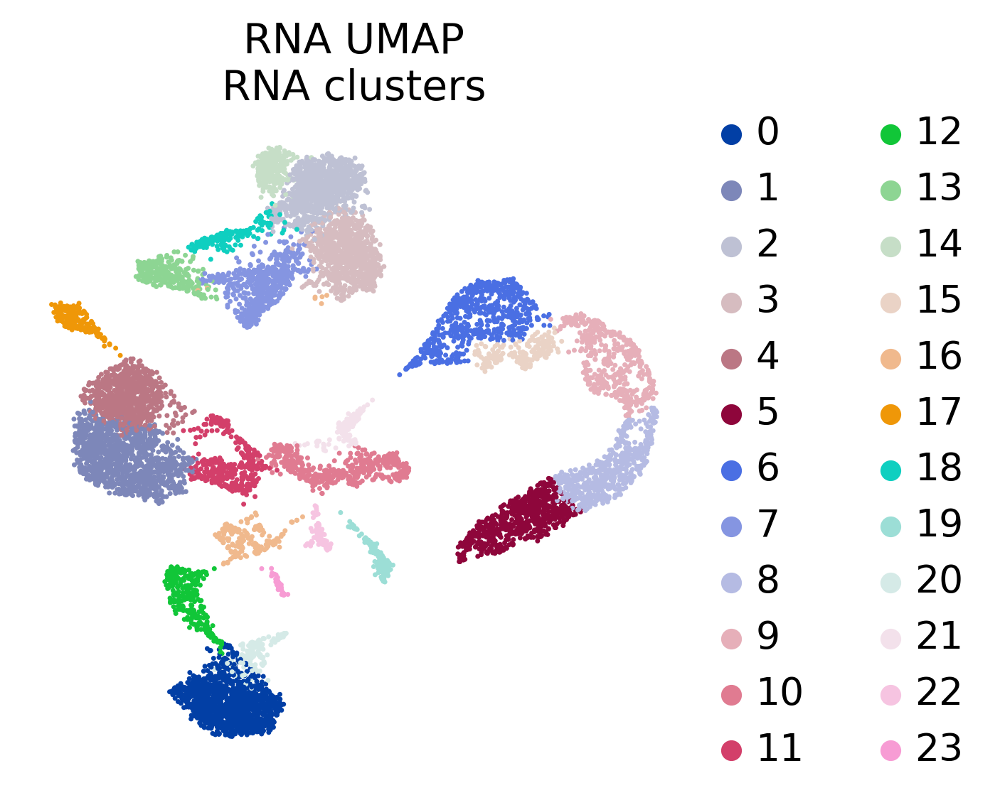

In [6]:
# Кластеризация
sc.tl.leiden(mdata["GEX"], resolution=1)
sc.pl.umap(mdata["GEX"], color="leiden", frameon=False, 
           title="RNA UMAP\nRNA clusters")

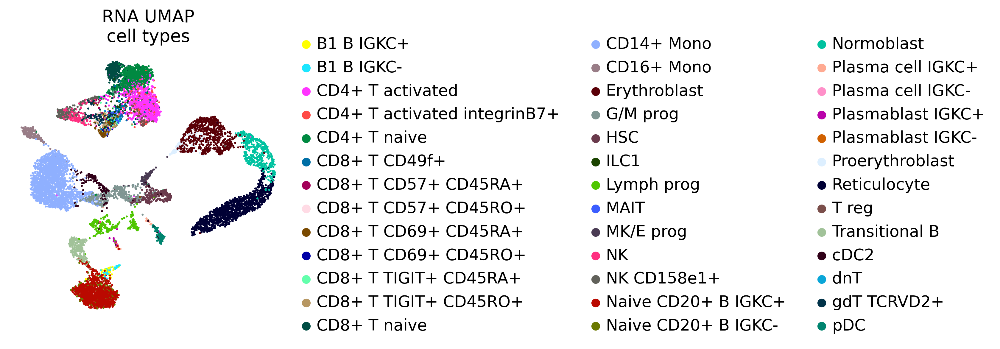

In [7]:
sc.pl.umap(mdata["GEX"], color="cell_type", frameon=False, 
           title="RNA UMAP\ncell types")

## Модальность ADT

### Без батч-коррекции

/usr/local/lib/python3.8/dist-packages/muon/_prot/preproc.py:214: UserWarning: adata.X is sparse but not in CSC format. Converting to CSC.
  warn("adata.X is sparse but not in CSC format. Converting to CSC.")
/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


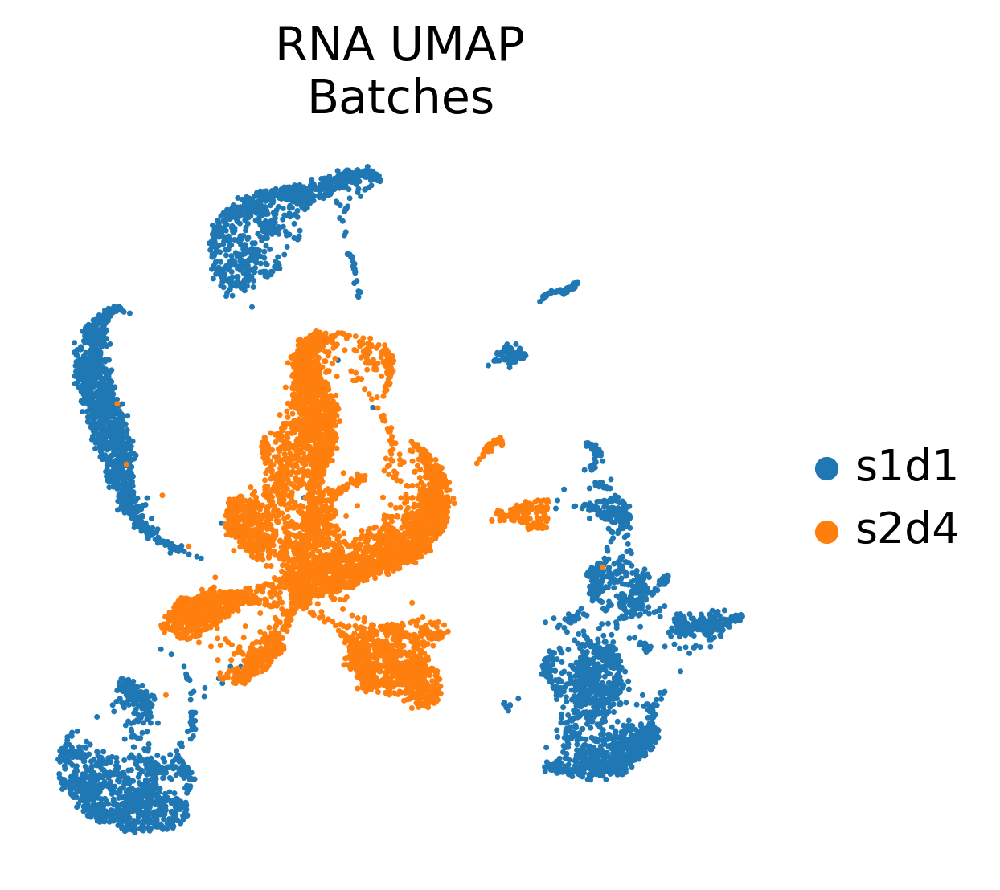

In [8]:
# Убедимся, что в `adata.X` лежат каунты
mdata["ADT"].X = mdata["ADT"].layers["counts"].copy()

# CLR
mu.prot.pp.clr(mdata["ADT"])

# Все наши переменные считаем HVG
mdata["ADT"].var["highly_variable"] = True

# PCA
sc.pp.scale(mdata["ADT"], max_value=10)
sc.tl.pca(mdata["ADT"])

# kNN-граф
sc.pp.neighbors(mdata["ADT"], n_pcs=30, n_neighbors=20)

# UMAP
sc.tl.umap(mdata["ADT"])
sc.pl.umap(mdata["ADT"], color="batch", frameon=False,
           title="RNA UMAP\nBatches")

### С батч-коррекцией

/usr/local/lib/python3.8/dist-packages/muon/_prot/preproc.py:214: UserWarning: adata.X is sparse but not in CSC format. Converting to CSC.
  warn("adata.X is sparse but not in CSC format. Converting to CSC.")
2022-12-27 04:50:30,781 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-27 04:50:43,004 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-27 04:50:43,145 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2022-12-27 04:50:48,711 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2022-12-27 04:50:54,054 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2022-12-27 04:50:59,440 - harmonypy - INFO - Iteration 4 of 20
INFO:harmonypy:Iteration 4 of 20
2022-12-27 04:51:04,724 - harmonypy - INFO - Iteration 5 of 20
INFO:harmonypy:Iteration 5 of 20
2022-12-2

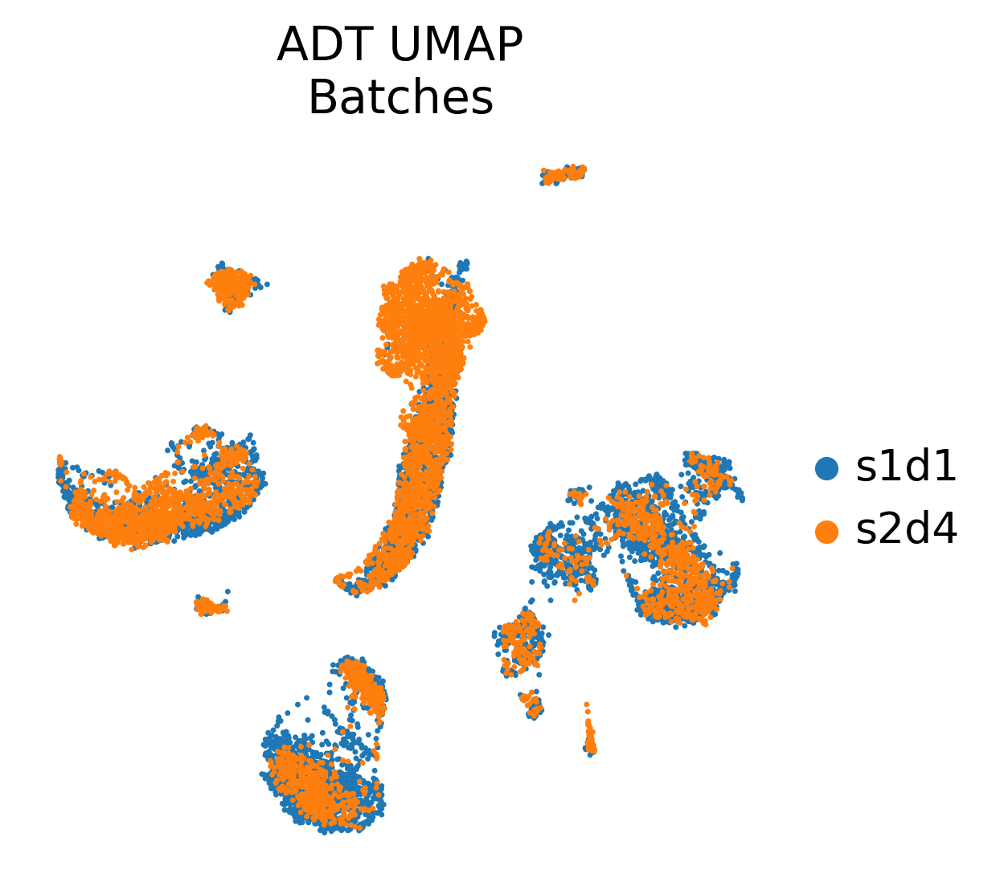

In [9]:
# Убедимся, что в `adata.X` лежат каунты
mdata["ADT"].X = mdata["ADT"].layers["counts"].copy()

# CLR
mu.prot.pp.clr(mdata["ADT"])

# Все наши переменные считаем HVG
mdata["ADT"].var["highly_variable"] = True

# PCA
mdata["ADT"].raw = mdata["ADT"]
sc.pp.scale(mdata["ADT"], max_value=10)
sc.tl.pca(mdata["ADT"])
sce.pp.harmony_integrate(mdata["ADT"], key="batch", max_iter_harmony=20)

# kNN-граф
sc.pp.neighbors(mdata["ADT"], n_pcs=30, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
sc.tl.umap(mdata["ADT"])
sc.pl.umap(mdata["ADT"], color="batch", frameon=False,
           title="ADT UMAP\nBatches")

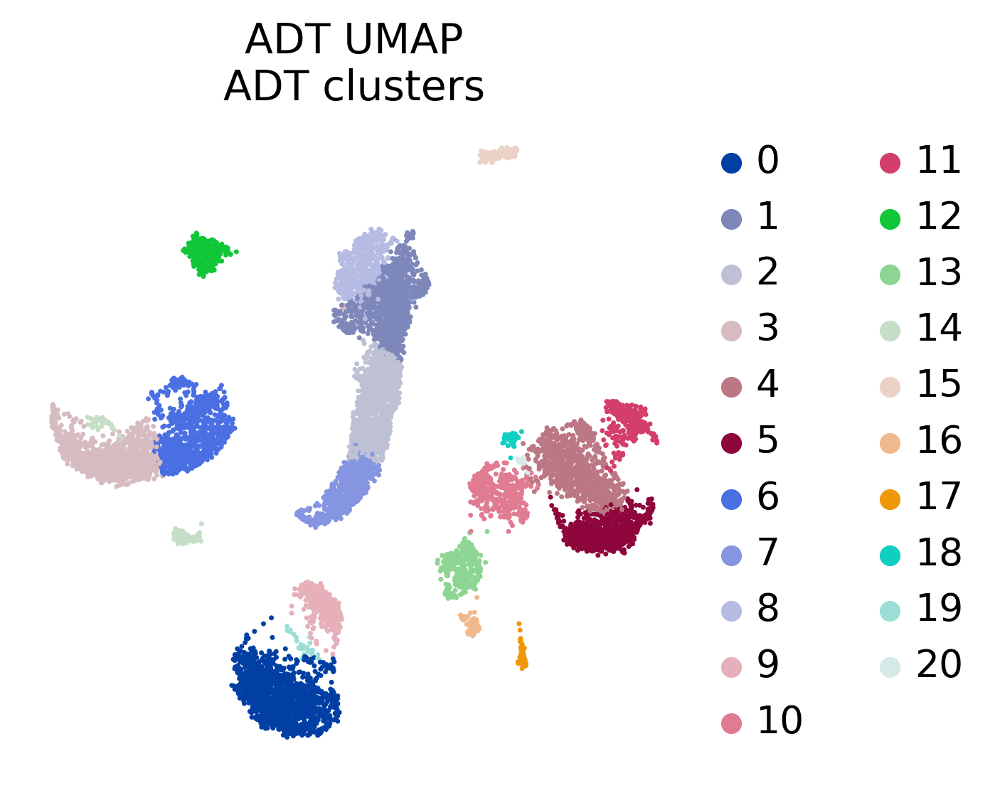

In [10]:
sc.tl.leiden(mdata["ADT"], resolution=1)
sc.pl.umap(mdata["ADT"], color="leiden", frameon=False,
           title="ADT UMAP\nADT clusters")

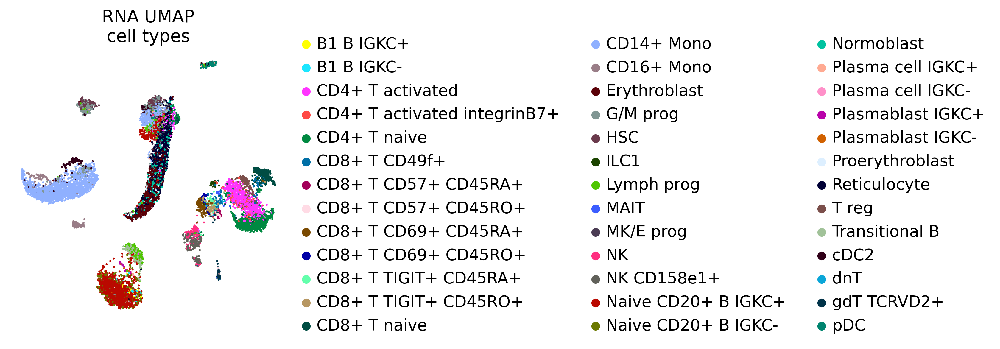

In [11]:
sc.pl.umap(mdata["ADT"], color="cell_type", frameon=False, 
           title="RNA UMAP\ncell types")

## Поддержка различных модальностей

In [12]:
sc.tl.leiden(mdata["GEX"], resolution=0.5)
sc.tl.leiden(mdata["ADT"], resolution=0.5)

mdata.obs["ADT:leiden"] = mdata["ADT"].obs["leiden"].copy()
mdata.obs["GEX:leiden"] = mdata["GEX"].obs["leiden"].copy()

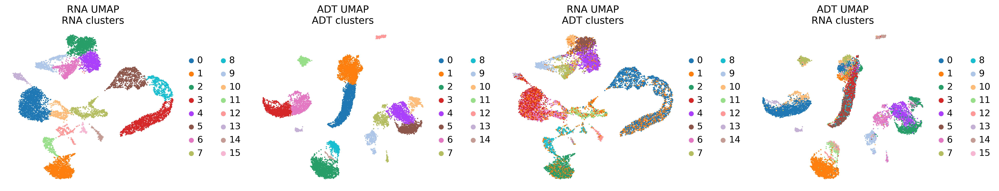

In [13]:
fig, axes = plt.subplots(figsize=(20, 4), ncols=4)

mu.pl.embedding(mdata, basis="GEX:X_umap", color="GEX:leiden",
                frameon=False, title="RNA UMAP\nRNA clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="ADT:X_umap", color="ADT:leiden",
                frameon=False, title="ADT UMAP\nADT clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="GEX:X_umap", color="ADT:leiden",
                frameon=False, title="RNA UMAP\nADT clusters", ax=axes[2],
                show=False)
mu.pl.embedding(mdata, basis="ADT:X_umap", color="GEX:leiden",
                frameon=False, title="ADT UMAP\nRNA clusters", ax=axes[3],
                show=False)

fig.tight_layout()

### MOFA

In [15]:
# Запуск MOFA
mu.tl.mofa(mdata, n_factors=30, groups_label="GEX:batch")


        #########################################################
        ###           __  __  ____  ______                    ### 
        ###          |  \/  |/ __ \|  ____/\    _             ### 
        ###          | \  / | |  | | |__ /  \ _| |_           ### 
        ###          | |\/| | |  | |  __/ /\ \_   _|          ###
        ###          | |  | | |__| | | / ____ \|_|            ###
        ###          |_|  |_|\____/|_|/_/    \_\              ###
        ###                                                   ### 
        ######################################################### 
       
 
        
Loaded view='ADT' group='s1d1' with N=5227 samples and D=134 features...
Loaded view='ADT' group='s2d4' with N=5584 samples and D=134 features...
Loaded view='GEX' group='s1d1' with N=5227 samples and D=13953 features...
Loaded view='GEX' group='s2d4' with N=5584 samples and D=13953 features...


Model options:
- Automatic Relevance Determination prior on the factors: True
- Aut

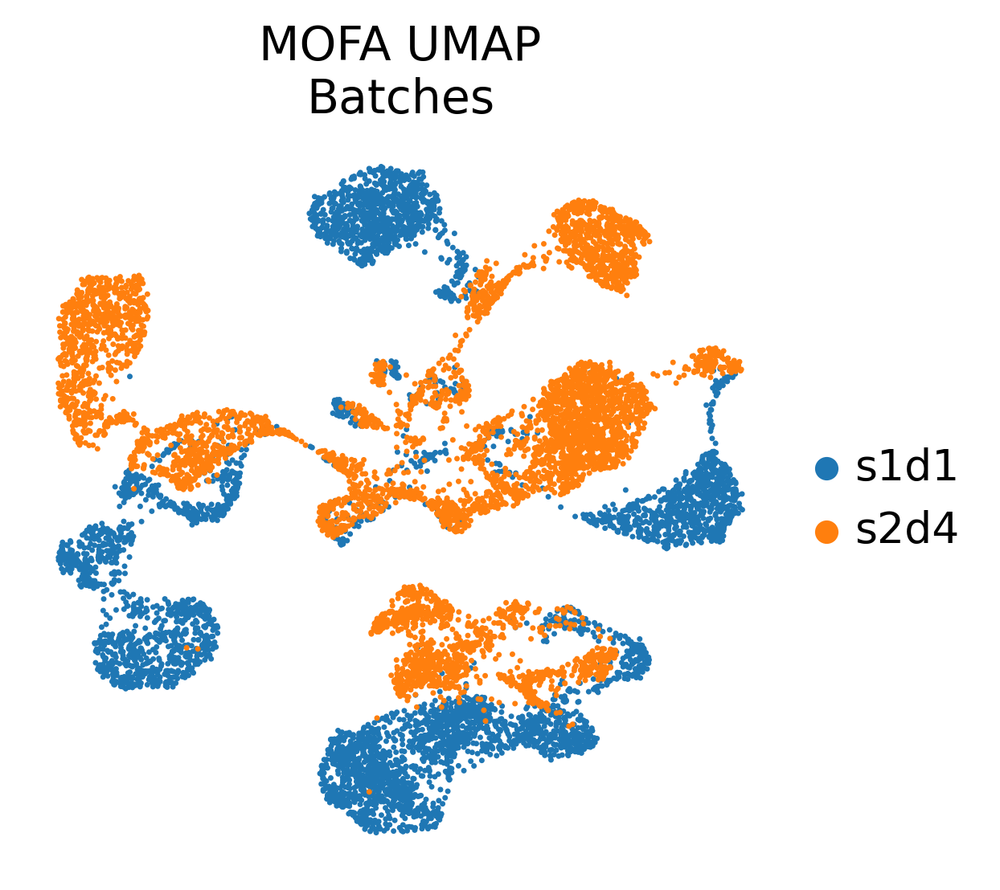

In [16]:
# kNN-граф
sc.pp.neighbors(mdata, use_rep="X_mofa", n_neighbors=20)

# UMAP
mdata.obsm["X_umap_MOFA"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()
sc.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:batch", frameon=False,
                title="MOFA UMAP\nBatches")

2022-12-27 04:19:48,150 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-27 04:19:57,674 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-27 04:19:58,053 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2022-12-27 04:20:05,232 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2022-12-27 04:20:11,160 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2022-12-27 04:20:17,499 - harmonypy - INFO - Iteration 4 of 20
INFO:harmonypy:Iteration 4 of 20
2022-12-27 04:20:23,493 - harmonypy - INFO - Iteration 5 of 20
INFO:harmonypy:Iteration 5 of 20
2022-12-27 04:20:29,855 - harmonypy - INFO - Iteration 6 of 20
INFO:harmonypy:Iteration 6 of 20
2022-12-27 04:20:33,962 - harmonypy - INFO - Iteration 7 of 20
INFO:harmonypy:Iteration 7 of 20
2022-12-27 04:20:35,949 - 

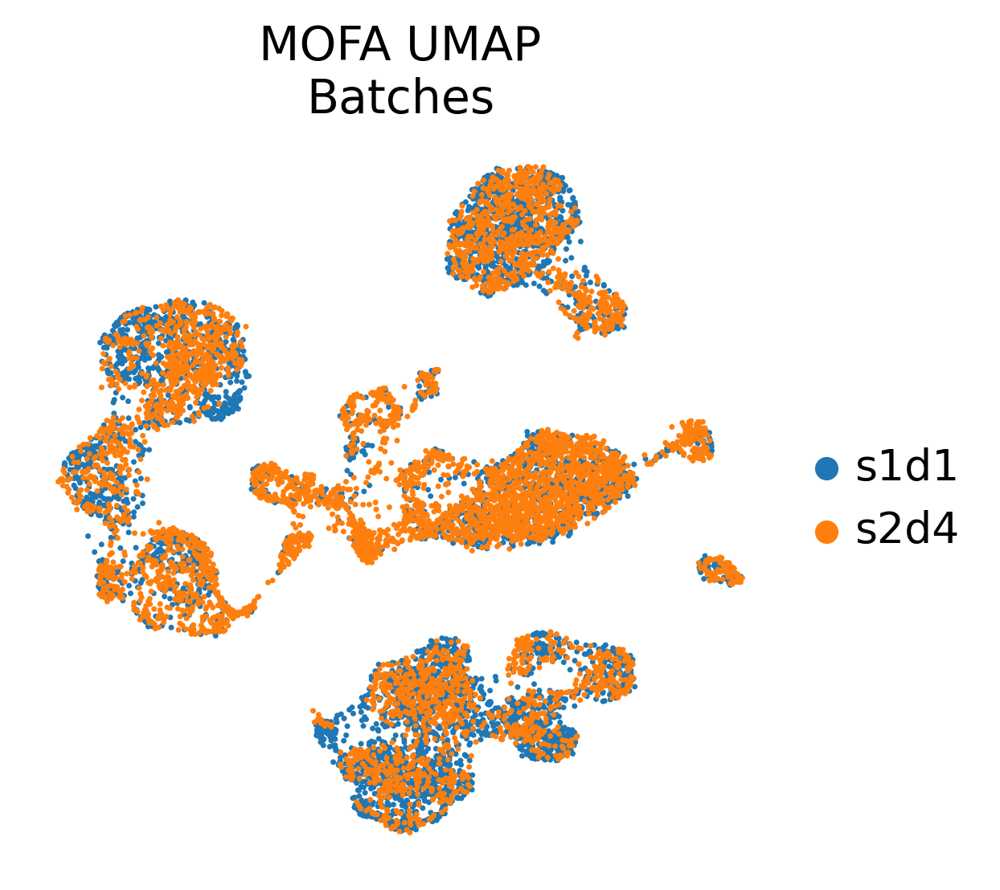

In [17]:
# Harmony
sce.pp.harmony_integrate(mdata, key="GEX:batch", max_iter_harmony=20, basis="X_mofa")

# kNN-граф
sc.pp.neighbors(mdata, n_pcs=30, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
mdata.obsm["X_umap_MOFA"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()
sc.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:batch", frameon=False,
                title="MOFA UMAP\nBatches")

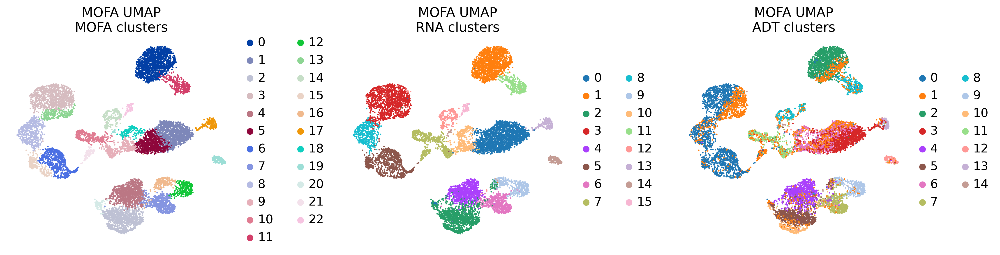

In [18]:
# кластеризация
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="leiden",
                frameon=False, title="MOFA UMAP\nMOFA clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:leiden",
                frameon=False, title="MOFA UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

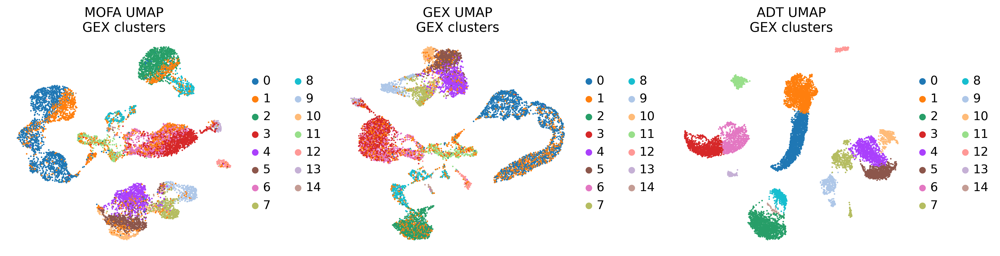

In [19]:
# кластеризация
fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nGEX clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="GEX:X_umap", color="ADT:leiden",
                frameon=False, title="GEX UMAP\nGEX clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="ADT:X_umap", color="ADT:leiden",
                frameon=False, title="ADT UMAP\nGEX clusters", ax=axes[2],
                show=False)
fig.tight_layout()

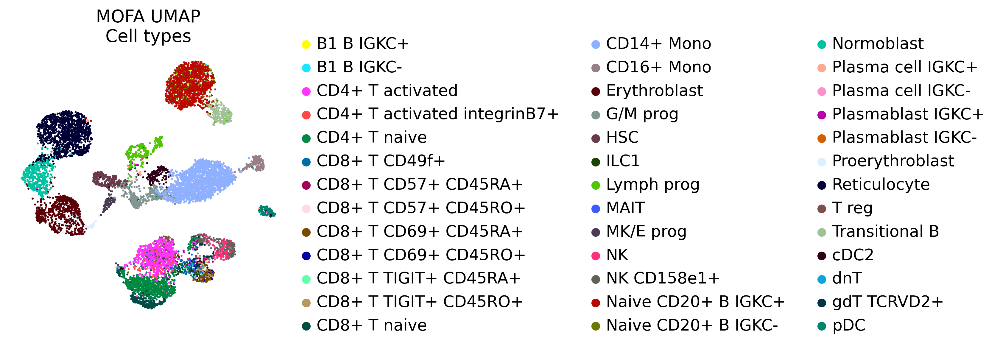

In [20]:
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:cell_type",
                frameon=False, title="MOFA UMAP\nCell types",)

### WNN

/usr/local/lib/python3.8/dist-packages/pynndescent/pynndescent_.py:346: NumbaWarning: Cannot cache compiled function "init_rp_tree" as it uses dynamic globals (such as ctypes pointers and large global arrays)
  init_rp_tree(data, dist, current_graph, leaf_array)
/usr/local/lib/python3.8/dist-packages/pynndescent/pynndescent_.py:348: NumbaWarning: Cannot cache compiled function "init_random" as it uses dynamic globals (such as ctypes pointers and large global arrays)
  init_random(n_neighbors, data, current_graph, dist, rng_state)
/usr/local/lib/python3.8/dist-packages/pynndescent/pynndescent_.py:358: NumbaWarning: Cannot cache compiled function "process_candidates" as it uses dynamic globals (such as ctypes pointers and large global arrays)
  nn_descent_internal_low_memory_parallel(
/usr/local/lib/python3.8/dist-packages/pynndescent/pynndescent_.py:346: NumbaWarning: Cannot cache compiled function "init_rp_tree" as it uses dynamic globals (such as ctypes pointers and large global array

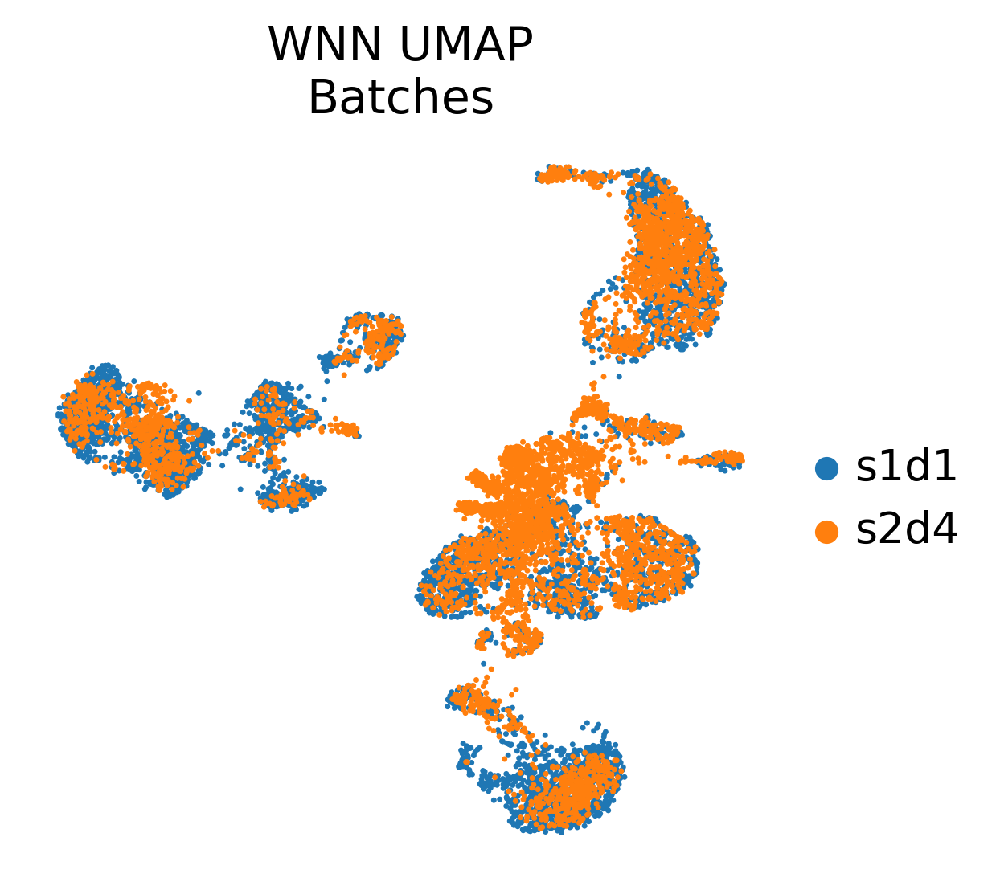

In [14]:
# L2-нормализация PCA
mu.pp.l2norm(mdata, rep="X_pca_harmony")

# Построение графа соседей на L2-отнормированных PCs
sc.pp.neighbors(mdata["GEX"], n_neighbors=20, n_pcs=30, use_rep="X_pca_harmony")
sc.pp.neighbors(mdata["ADT"], n_neighbors=20, n_pcs=30, use_rep="X_pca_harmony")

# Построение WNN
mu.pp.neighbors(mdata)
mdata.obsm["X_umap_WNN"] = mu.tl.umap(mdata, copy=True).obsm["X_umap"].copy()

sc.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:batch", frameon=False,
                title="WNN UMAP\nBatches")

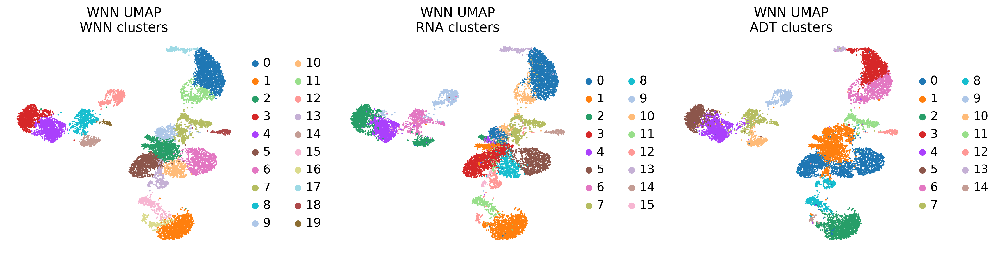

In [15]:
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="leiden",
                frameon=False, title="WNN UMAP\nWNN clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:leiden",
                frameon=False, title="WNN UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="ADT:leiden",
                frameon=False, title="WNN UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

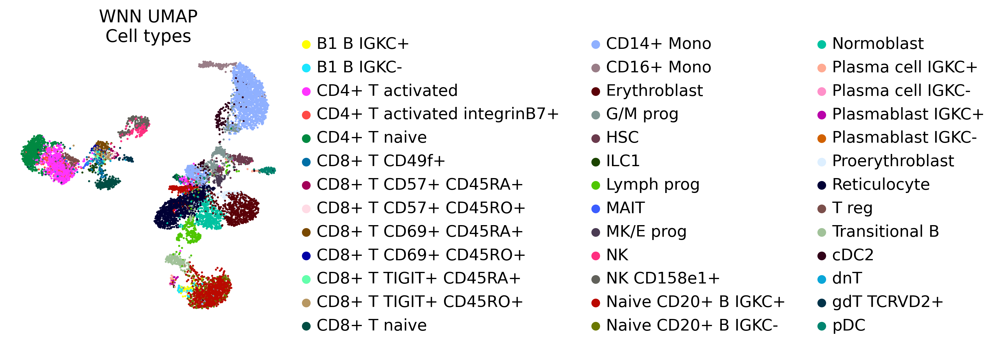

In [16]:
mu.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:cell_type",
                frameon=False, title="WNN UMAP\nCell types",)

## PCA concatenation

2022-12-27 04:24:31,281 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-27 04:24:40,714 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-27 04:25:00,899 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-27 04:25:05,102 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.


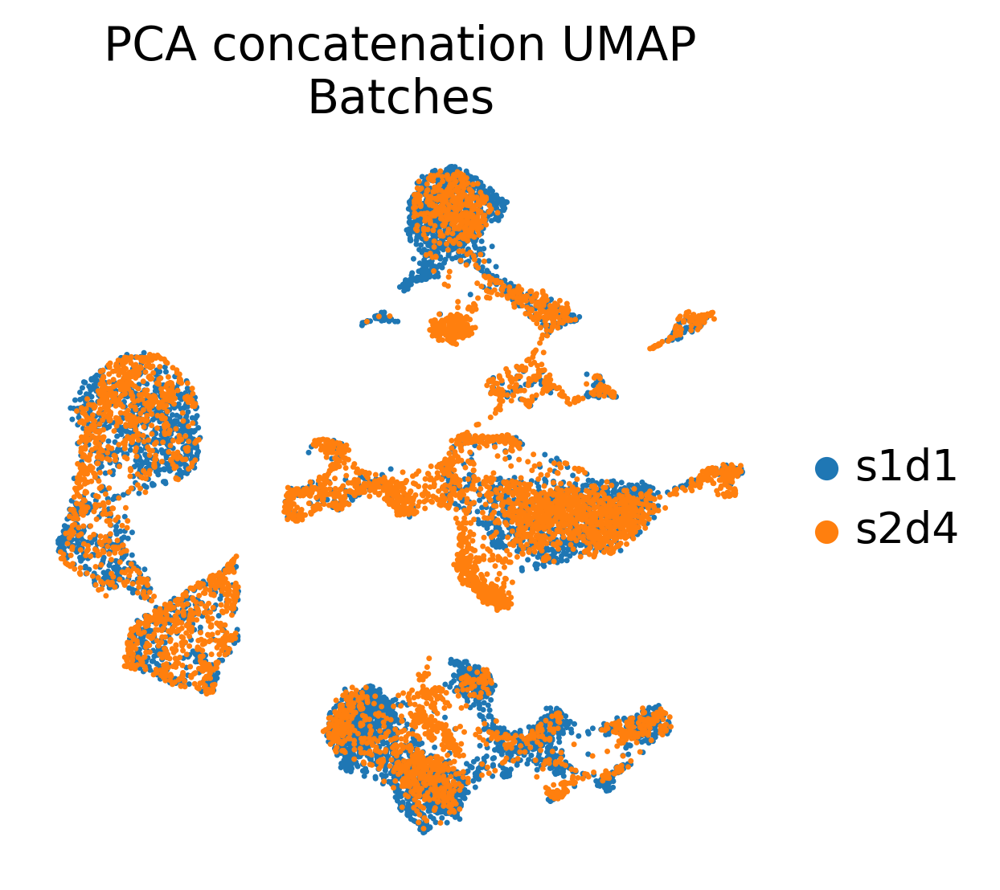

In [24]:
sc.tl.pca(mdata["GEX"], n_comps=30)
sc.tl.pca(mdata["ADT"], n_comps=20)

sce.pp.harmony_integrate(mdata["GEX"], key="batch", max_iter_harmony=20, verbose=False)
sce.pp.harmony_integrate(mdata["ADT"], key="batch", max_iter_harmony=20, verbose=False)

mu.pp.l2norm(mdata, rep="X_pca_harmony")
mdata.obsm["X_pca_harmony"] = np.hstack([mdata["GEX"].obsm["X_pca_harmony"], mdata["ADT"].obsm["X_pca_harmony"]])

sc.pp.neighbors(mdata, n_neighbors=20, n_pcs=50, use_rep="X_pca_harmony")
mdata.obsm["X_umap_PCAconcat"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()

sc.pl.embedding(mdata, basis="X_umap_PCAconcat", color="GEX:batch", frameon=False,
                title="PCA concatenation UMAP\nBatches")

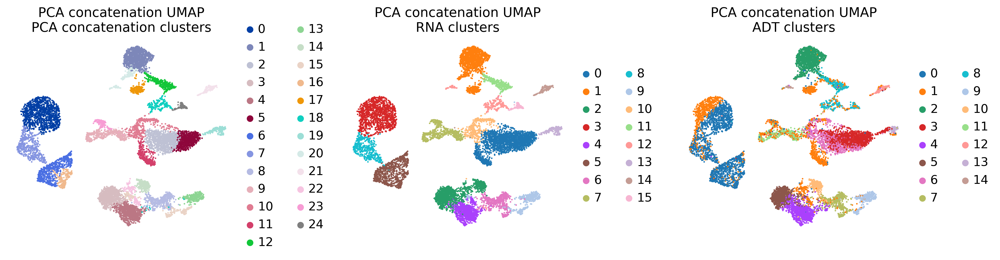

In [25]:
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_PCAconcat", color="leiden",
                frameon=False, title="PCA concatenation UMAP\nPCA concatenation clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_PCAconcat", color="GEX:leiden",
                frameon=False, title="PCA concatenation UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_PCAconcat", color="ADT:leiden",
                frameon=False, title="PCA concatenation UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

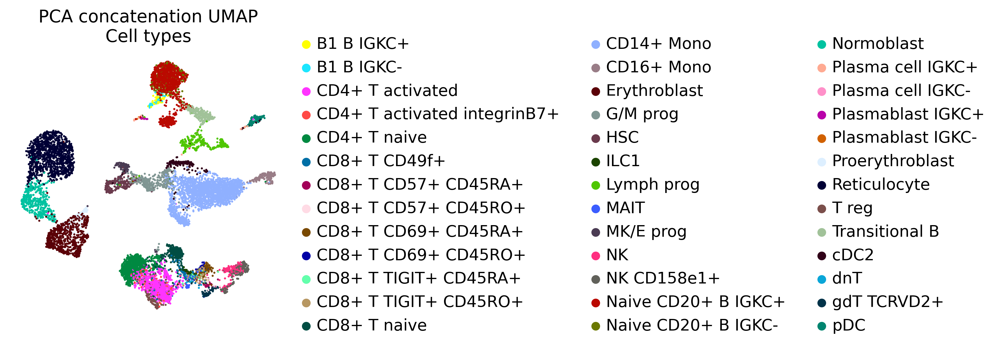

In [26]:
mu.pl.embedding(mdata, basis="X_umap_PCAconcat", color="GEX:cell_type",
                frameon=False, title="PCA concatenation UMAP\nCell types")

## Домашнее задание



### Задание

Попробуйте запустить MOFA с меньшим числом факторов (например, 10, как указано по умолчанию). Что поменялось?

In [ ]:
mu.tl.mofa(mdata, n_factors=10, groups_label="GEX:batch")


2022-12-27 04:37:44,310 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
INFO:harmonypy:Computing initial centroids with sklearn.KMeans...
2022-12-27 04:37:51,725 - harmonypy - INFO - sklearn.KMeans initialization complete.
INFO:harmonypy:sklearn.KMeans initialization complete.
2022-12-27 04:37:51,879 - harmonypy - INFO - Iteration 1 of 20
INFO:harmonypy:Iteration 1 of 20
2022-12-27 04:37:56,872 - harmonypy - INFO - Iteration 2 of 20
INFO:harmonypy:Iteration 2 of 20
2022-12-27 04:38:04,793 - harmonypy - INFO - Iteration 3 of 20
INFO:harmonypy:Iteration 3 of 20
2022-12-27 04:38:11,289 - harmonypy - INFO - Iteration 4 of 20
INFO:harmonypy:Iteration 4 of 20
2022-12-27 04:38:16,219 - harmonypy - INFO - Iteration 5 of 20
INFO:harmonypy:Iteration 5 of 20
2022-12-27 04:38:19,308 - harmonypy - INFO - Iteration 6 of 20
INFO:harmonypy:Iteration 6 of 20
2022-12-27 04:38:22,433 - harmonypy - INFO - Iteration 7 of 20
INFO:harmonypy:Iteration 7 of 20
2022-12-27 04:38:24,671 - 

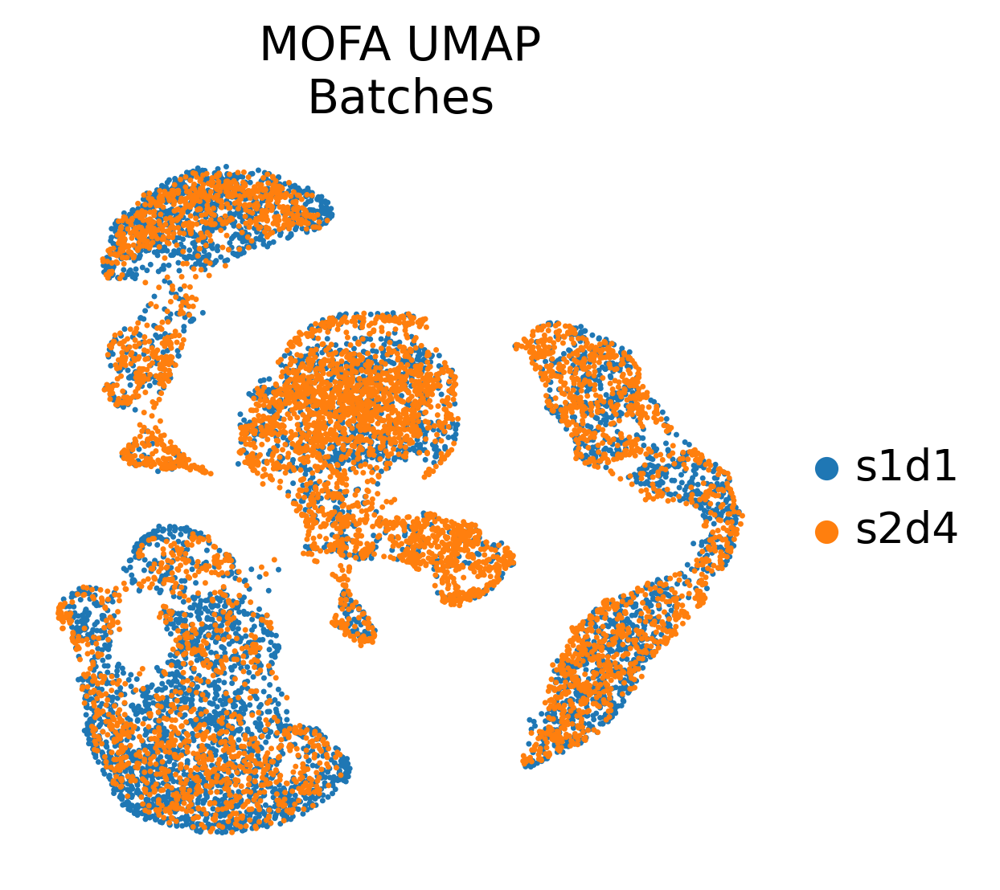

In [28]:
# kNN-граф
sc.pp.neighbors(mdata, use_rep="X_mofa", n_neighbors=20)

# Harmony
sce.pp.harmony_integrate(mdata, key="GEX:batch", max_iter_harmony=20, basis="X_mofa")

# kNN-граф
sc.pp.neighbors(mdata, n_pcs=10, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
mdata.obsm["X_umap_MOFA"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()
sc.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:batch", frameon=False,
                title="MOFA UMAP\nBatches")

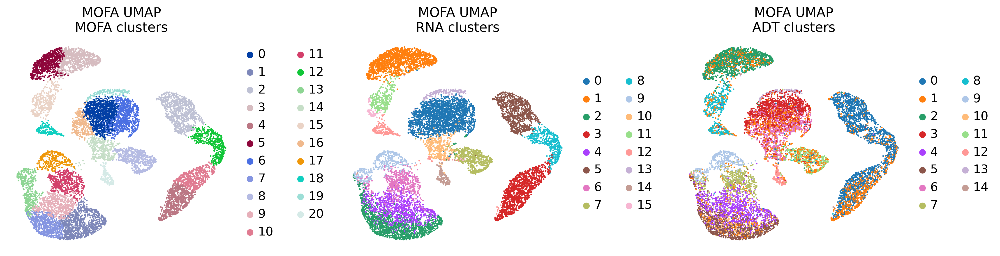

In [29]:
# кластеризация
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="leiden",
                frameon=False, title="MOFA UMAP\nMOFA clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:leiden",
                frameon=False, title="MOFA UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

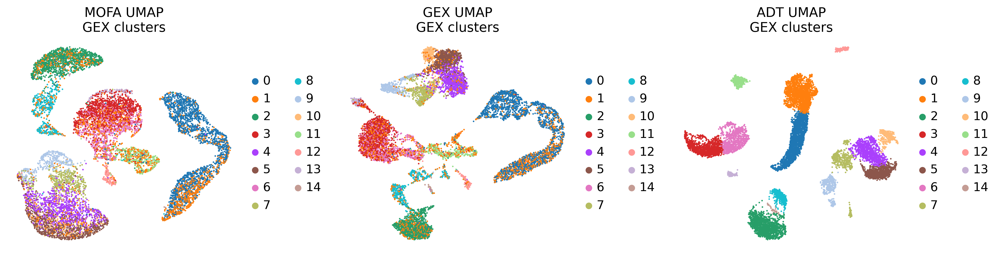

In [30]:
# кластеризация
fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nGEX clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="GEX:X_umap", color="ADT:leiden",
                frameon=False, title="GEX UMAP\nGEX clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="ADT:X_umap", color="ADT:leiden",
                frameon=False, title="ADT UMAP\nGEX clusters", ax=axes[2],
                show=False)
fig.tight_layout()

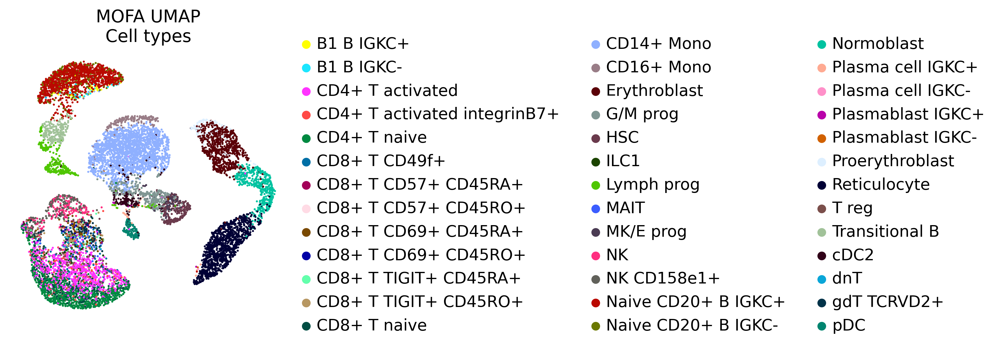

In [31]:
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:cell_type",
                frameon=False, title="MOFA UMAP\nCell types",)

Поменялось количество кластеров, однако они хорошо обнаружены

### Задание

Попробуйте запустить MOFA на одной модальности (например, только на РНК). Сравните получившиеся результаты с PCA. Сходятся ли результаты?

In [ ]:
mu.tl.mofa(mdata['GEX'], n_factors=30, groups_label="batch")
# kNN-граф
sc.pp.neighbors(mdata, use_rep="X_mofa", n_neighbors=20)

# Harmony
sce.pp.harmony_integrate(mdata, key="GEX:batch", max_iter_harmony=20, basis="X_mofa")

# kNN-граф
sc.pp.neighbors(mdata, n_pcs=30, n_neighbors=20, use_rep="X_pca_harmony")

# UMAP
mdata.obsm["X_umap_MOFA"] = sc.tl.umap(mdata, copy=True).obsm["X_umap"].copy()
sc.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:batch", frameon=False,
                title="MOFA UMAP\nBatches")

In [ ]:
# кластеризация
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="leiden",
                frameon=False, title="MOFA UMAP\nMOFA clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="GEX:leiden",
                frameon=False, title="MOFA UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_MOFA", color="ADT:leiden",
                frameon=False, title="MOFA UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

### Задание

Попробуйте запустить WNN без L2-нормализации PCA в начале. Что-то поменялось? Какой результат, на ваш взгляд, лучше?

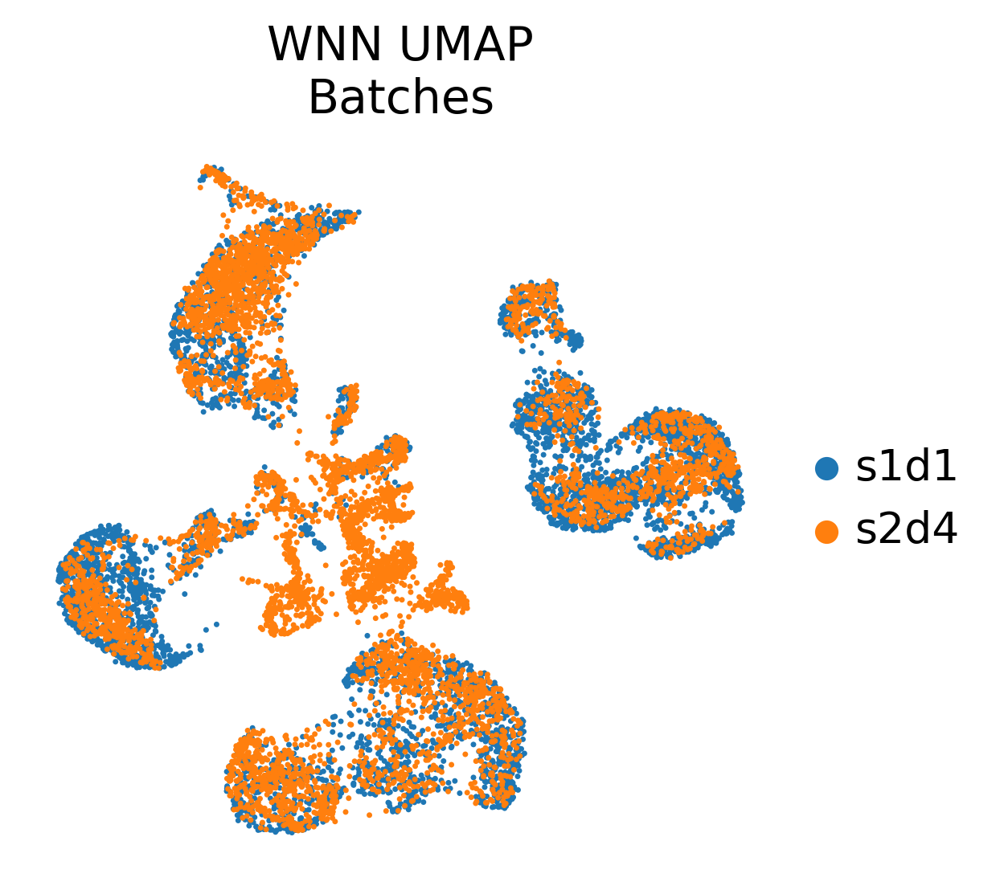

In [33]:
# Построение графа соседей на L2-отнормированных PCs
sc.pp.neighbors(mdata["GEX"], n_neighbors=20, n_pcs=10, use_rep="X_pca_harmony")
sc.pp.neighbors(mdata["ADT"], n_neighbors=20, n_pcs=10, use_rep="X_pca_harmony")

# Построение WNN
mu.pp.neighbors(mdata)
mdata.obsm["X_umap_WNN"] = mu.tl.umap(mdata, copy=True).obsm["X_umap"].copy()

sc.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:batch", frameon=False,
                title="WNN UMAP\nBatches")

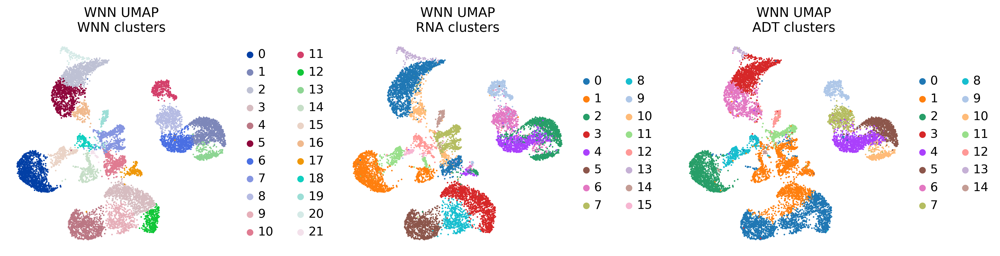

In [34]:
sc.tl.leiden(mdata)

fig, axes = plt.subplots(figsize=(15, 4), ncols=3)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="leiden",
                frameon=False, title="WNN UMAP\nWNN clusters", ax=axes[0],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:leiden",
                frameon=False, title="WNN UMAP\nRNA clusters", ax=axes[1],
                show=False)
mu.pl.embedding(mdata, basis="X_umap_WNN", color="ADT:leiden",
                frameon=False, title="WNN UMAP\nADT clusters", ax=axes[2],
                show=False)
fig.tight_layout()

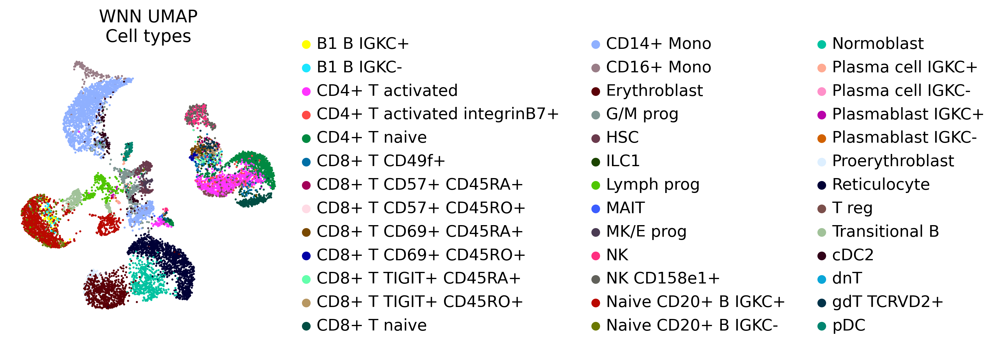

In [35]:
mu.pl.embedding(mdata, basis="X_umap_WNN", color="GEX:cell_type",
                frameon=False, title="WNN UMAP\nCell types",)

Здесь снова кластеров стало больше, но в целом результат похож на то, что было

### Задание

Попробуйте написать функцию-wrapper через `rpy2`, которая бы реализовывала WNN, который имплементирован в Seurat. Есть ли разница с тем, что происходит в результате работы `muon`?

In [36]:
#https://satijalab.org/seurat/articles/weighted_nearest_neighbor_analysis.html

In [17]:
!apt-get install libgmp3-dev libcairo2-dev libharfbuzz-dev libfribidi-dev libudunits2-dev
!gdown "1W0TuuQospxcasOX5cQdhT_Xd-k7-QAck&confirm=t"
!tar xf library.tar.gz
!pip3 install scanpy[leiden] anndata2ri

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libharfbuzz-dev is already the newest version (1.7.2-1ubuntu1).
libudunits2-dev is already the newest version (2.2.26-1).
libcairo2-dev is already the newest version (1.15.10-2ubuntu0.1).
libfribidi-dev is already the newest version (0.19.7-2ubuntu0.1).
libgmp3-dev is already the newest version (2:6.1.2+dfsg-2ubuntu0.1).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 20 not upgraded.
Downloading...
From: https://drive.google.com/uc?id=1W0TuuQospxcasOX5cQdhT_Xd-k7-QAck&confirm=t
To: /content/library.tar.gz
100% 2.33G/2.33G [00:19<00:00, 120MB/s]
tar: Removing leading `/' from member names
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install rpy2==3.5.1

In [18]:
%load_ext rpy2.ipython
%R .libPaths("usr/local/lib/R/site-library/")

'/content/...,'/usr/loca...,'/usr/lib/...,'/usr/lib/...


In [19]:
import rpy2.robjects as ro

In [20]:
import anndata2ri
anndata2ri.activate()

In [21]:
 %%R
 library(Seurat)
 library(dplyr)


    consider that it could be called from a Python process. This
    results in a quasi-obligatory segfault when rpy2 is evaluating
    R code using it. On the hand, rpy2 is accounting for the
    fact that it might already be running embedded in a Python
    process. This is why:
    - Python -> rpy2 -> R -> reticulate: crashes
    - R -> reticulate -> Python -> rpy2: works

    The issue with reticulate is tracked here:
    https://github.com/rstudio/reticulate/issues/208
    



Attaching package: ‘dplyr’



    filter, lag



    intersect, setdiff, setequal, union




In [22]:
def wnn(mu_data):
  ro.globalenv["gex"] = mu_data["GEX"]
  ro.globalenv["adt"] = mu_data["ADT"]
  ro.r("gex_r <- CreateSeuratObject(counts = assay(gex,'X'))")
  ro.r('gex_r[["ADT"]] <- CreateAssayObject(counts = assay(adt,"X"))')

  ro.r("DefaultAssay(gex_r) <- 'RNA'")
  ro.r("gex_r <- NormalizeData(gex_r) %>% FindVariableFeatures() %>% ScaleData() %>% RunPCA()")

  ro.r('DefaultAssay(gex_r) <- "ADT"')
  ro.r('VariableFeatures(gex_r) <- rownames(gex_r[["ADT"]])')
  ro.r('gex_r <- NormalizeData(gex_r, normalization.method = "CLR", margin = 2) %>% ScaleData() %>% RunPCA(reduction.name = "apca")')

  ro.r('gex_r <- FindMultiModalNeighbors(gex_r, reduction.list = list("pca", "apca"), dims.list = list(1:30, 1:18), modality.weight.name = "RNA.weight", verbose = FALSE)')

  ro.r('gex_r <- RunUMAP(gex_r, nn.name = "weighted.nn", reduction.name = "wnn.umap", reduction.key = "wnnUMAP_", verbose = FALSE)')
  ro.r('gex_r <- FindClusters(gex_r, graph.name = "wsnn", algorithm = 3, resolution = 1, verbose = FALSE)')

  ro.r('p1 <- DimPlot(gex_r, reduction = "wnn.umap", label = TRUE, repel = TRUE, label.size = 4.5)')
  ro.r('p1')

In [ ]:
wnn(mdata)

Не знаю в чем проблема, но у меня начал очень сильно вылетать колаб, и у меня не получается прогнать эту функцию. У нее точно работает начало, а все что дальше взято из документации, поэтому тоже должно работать, но оно не справляется(

Я попробую еще, но пока так